In [1]:
using Pkg

In [2]:
ENV["PYTHON"] = "/home/tung/anaconda3/envs/celldancer/bin/python3"

"/home/tung/anaconda3/envs/celldancer/bin/python3"

In [3]:
Pkg.build("PyCall")

    Building Conda ─→ `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/b19db3927f0db4151cb86d073689f2428e524576/build.log`
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/9816a3826b0ebf49ab4926e2b18842ad8b5c8f04/build.log`


In [4]:
using JuloVelo
using Plots

In [5]:
adata = read_adata("data/JuloVelo_pre.h5ad")

AnnData object 2564 ✕ 2000

In [6]:
adata.uns["iroot"] = 2

2

In [7]:
normalize(adata)

AnnData object 2564 ✕ 2000

In [8]:
filter_and_gene_kinetics_predetermination(adata)

[ Info: 1693 genes are filtered due to low correlation between norm_u and norm_s
[ Info: See adata.var[!, "bad_correlation_genes"] for details
[ Info: 6 genes are filtered due to bad kinetics
[ Info: See adata.var[!, "bad_kinetics_genes"] for details
[ Info: 301 genes are used to infer velocity
[ Info: See adata.var[!, "train_genes"] for details


AnnData object 2564 ✕ 2000

In [9]:
reshape_data(adata)

[ Info: Data is reshaped to (2, 2564, 301)


AnnData object 2564 ✕ 2000

In [10]:
Kinetics = build_velocity_model(adata)

[ Info: Successfully initialize velocity model


Chain(
  SpatialDense(2 => 100, depth = 301, leakyrelu),  # 90_300 parameters
  SpatialDense(100 => 100, depth = 301, leakyrelu),  # 3_040_100 parameters
  SpatialDense(100 => 3, depth = 301, σ),  # 91_203 parameters
)                   # Total: 6 arrays, 3_221_603 parameters, 12.290 MiB.

In [11]:
density_sampling(adata)

[ Info: Sample 2400 cells


AnnData object 2564 ✕ 2000

In [12]:
train(adata, Kinetics)

[ Info: Training on gpu
[ Info: Training with Adam Optimizer
[ Info: TensorBoard logging at "/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/dentategyrus/main_branch/saves/"
[ Info: Start training


Epoch: 0  Train: (cos_loss = 42523.074f0, penalty = 1066.3309f0, AvgMeanCos = 0.9411f0)
Epoch: 1  Train: (cos_loss = 41986.55f0, penalty = 1066.2861f0, AvgMeanCos = 0.9419f0)
Epoch: 2  Train: (cos_loss = 41499.438f0, penalty = 1066.241f0, AvgMeanCos = 0.9426f0)
Epoch: 3  Train: (cos_loss = 41032.297f0, penalty = 1066.1963f0, AvgMeanCos = 0.9432f0)
Epoch: 4  Train: (cos_loss = 40582.785f0, penalty = 1066.1514f0, AvgMeanCos = 0.9438f0)
Epoch: 5  Train: (cos_loss = 40147.39f0, penalty = 1066.1072f0, AvgMeanCos = 0.9444f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 6  Train: (cos_loss = 39720.008f0, penalty = 1066.0626f0, AvgMeanCos = 0.945f0)
Epoch: 7  Train: (cos_loss = 39327.45f0, penalty = 1066.0181f0, AvgMeanCos = 0.9456f0)
Epoch: 8  Train: (cos_loss = 38988.133f0, penalty = 1065.9735f0, AvgMeanCos = 0.946f0)
Epoch: 9  Train: (cos_loss = 38645.61f0, penalty = 1065.9297f0, AvgMeanCos = 0.9465f0)
Epoch: 10  Train: (cos_loss = 38328.21f0, penalty = 1065.8861f0, AvgMeanCos = 0.9469f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 11  Train: (cos_loss = 38018.04f0, penalty = 1065.8428f0, AvgMeanCos = 0.9474f0)
Epoch: 12  Train: (cos_loss = 37735.555f0, penalty = 1065.7996f0, AvgMeanCos = 0.9478f0)
Epoch: 13  Train: (cos_loss = 37466.914f0, penalty = 1065.7565f0, AvgMeanCos = 0.9481f0)
Epoch: 14  Train: (cos_loss = 37237.65f0, penalty = 1065.713f0, AvgMeanCos = 0.9485f0)
Epoch: 15  Train: (cos_loss = 37037.656f0, penalty = 1065.6687f0, AvgMeanCos = 0.9487f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 16  Train: (cos_loss = 36849.652f0, penalty = 1065.6235f0, AvgMeanCos = 0.949f0)
Epoch: 17  Train: (cos_loss = 36671.914f0, penalty = 1065.5773f0, AvgMeanCos = 0.9492f0)
Epoch: 18  Train: (cos_loss = 36510.797f0, penalty = 1065.5304f0, AvgMeanCos = 0.9495f0)
Epoch: 19  Train: (cos_loss = 36356.895f0, penalty = 1065.4827f0, AvgMeanCos = 0.9497f0)
Epoch: 20  Train: (cos_loss = 36203.973f0, penalty = 1065.4343f0, AvgMeanCos = 0.9499f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 21  Train: (cos_loss = 36051.258f0, penalty = 1065.385f0, AvgMeanCos = 0.9501f0)
Epoch: 22  Train: (cos_loss = 35901.125f0, penalty = 1065.3351f0, AvgMeanCos = 0.9503f0)
Epoch: 23  Train: (cos_loss = 35759.324f0, penalty = 1065.2843f0, AvgMeanCos = 0.9505f0)
Epoch: 24  Train: (cos_loss = 35631.863f0, penalty = 1065.233f0, AvgMeanCos = 0.9507f0)
Epoch: 25  Train: (cos_loss = 35504.316f0, penalty = 1065.181f0, AvgMeanCos = 0.9509f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 26  Train: (cos_loss = 35395.223f0, penalty = 1065.1285f0, AvgMeanCos = 0.951f0)
Epoch: 27  Train: (cos_loss = 35280.312f0, penalty = 1065.0756f0, AvgMeanCos = 0.9512f0)
Epoch: 28  Train: (cos_loss = 35184.555f0, penalty = 1065.0223f0, AvgMeanCos = 0.9513f0)
Epoch: 29  Train: (cos_loss = 35092.305f0, penalty = 1064.9685f0, AvgMeanCos = 0.9514f0)
Epoch: 30  Train: (cos_loss = 34995.387f0, penalty = 1064.9147f0, AvgMeanCos = 0.9516f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 31  Train: (cos_loss = 34901.664f0, penalty = 1064.8604f0, AvgMeanCos = 0.9517f0)
Epoch: 32  Train: (cos_loss = 34812.43f0, penalty = 1064.806f0, AvgMeanCos = 0.9518f0)
Epoch: 33  Train: (cos_loss = 34728.11f0, penalty = 1064.7516f0, AvgMeanCos = 0.9519f0)
Epoch: 34  Train: (cos_loss = 34641.023f0, penalty = 1064.6968f0, AvgMeanCos = 0.952f0)
Epoch: 35  Train: (cos_loss = 34560.973f0, penalty = 1064.6417f0, AvgMeanCos = 0.9522f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 36  Train: (cos_loss = 34479.812f0, penalty = 1064.5863f0, AvgMeanCos = 0.9523f0)
Epoch: 37  Train: (cos_loss = 34401.227f0, penalty = 1064.5303f0, AvgMeanCos = 0.9524f0)
Epoch: 38  Train: (cos_loss = 34327.824f0, penalty = 1064.4741f0, AvgMeanCos = 0.9525f0)
Epoch: 39  Train: (cos_loss = 34262.227f0, penalty = 1064.4177f0, AvgMeanCos = 0.9526f0)
Epoch: 40  Train: (cos_loss = 34199.39f0, penalty = 1064.361f0, AvgMeanCos = 0.9527f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 41  Train: (cos_loss = 34141.23f0, penalty = 1064.3037f0, AvgMeanCos = 0.9527f0)
Epoch: 42  Train: (cos_loss = 34086.664f0, penalty = 1064.2463f0, AvgMeanCos = 0.9528f0)
Epoch: 43  Train: (cos_loss = 34035.67f0, penalty = 1064.1884f0, AvgMeanCos = 0.9529f0)
Epoch: 44  Train: (cos_loss = 33989.465f0, penalty = 1064.1299f0, AvgMeanCos = 0.9529f0)
Epoch: 45  Train: (cos_loss = 33941.516f0, penalty = 1064.0713f0, AvgMeanCos = 0.953f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 46  Train: (cos_loss = 33892.133f0, penalty = 1064.0127f0, AvgMeanCos = 0.9531f0)
Epoch: 47  Train: (cos_loss = 33838.66f0, penalty = 1063.9537f0, AvgMeanCos = 0.9532f0)
Epoch: 48  Train: (cos_loss = 33790.285f0, penalty = 1063.8948f0, AvgMeanCos = 0.9532f0)
Epoch: 49  Train: (cos_loss = 33743.984f0, penalty = 1063.8356f0, AvgMeanCos = 0.9533f0)
Epoch: 50  Train: (cos_loss = 33700.23f0, penalty = 1063.7759f0, AvgMeanCos = 0.9533f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 51  Train: (cos_loss = 33656.168f0, penalty = 1063.7162f0, AvgMeanCos = 0.9534f0)
Epoch: 52  Train: (cos_loss = 33613.62f0, penalty = 1063.6561f0, AvgMeanCos = 0.9535f0)
Epoch: 53  Train: (cos_loss = 33570.42f0, penalty = 1063.5958f0, AvgMeanCos = 0.9535f0)
Epoch: 54  Train: (cos_loss = 33529.64f0, penalty = 1063.5352f0, AvgMeanCos = 0.9536f0)
Epoch: 55  Train: (cos_loss = 33487.793f0, penalty = 1063.4744f0, AvgMeanCos = 0.9536f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 56  Train: (cos_loss = 33446.277f0, penalty = 1063.4135f0, AvgMeanCos = 0.9537f0)
Epoch: 57  Train: (cos_loss = 33409.625f0, penalty = 1063.3523f0, AvgMeanCos = 0.9538f0)
Epoch: 58  Train: (cos_loss = 33373.29f0, penalty = 1063.2908f0, AvgMeanCos = 0.9538f0)
Epoch: 59  Train: (cos_loss = 33337.414f0, penalty = 1063.2292f0, AvgMeanCos = 0.9539f0)
Epoch: 60  Train: (cos_loss = 33303.734f0, penalty = 1063.1681f0, AvgMeanCos = 0.9539f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 61  Train: (cos_loss = 33267.348f0, penalty = 1063.1066f0, AvgMeanCos = 0.9539f0)
Epoch: 62  Train: (cos_loss = 33234.527f0, penalty = 1063.0449f0, AvgMeanCos = 0.954f0)
Epoch: 63  Train: (cos_loss = 33202.305f0, penalty = 1062.983f0, AvgMeanCos = 0.954f0)
Epoch: 64  Train: (cos_loss = 33168.895f0, penalty = 1062.921f0, AvgMeanCos = 0.9541f0)
Epoch: 65  Train: (cos_loss = 33137.723f0, penalty = 1062.859f0, AvgMeanCos = 0.9541f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 66  Train: (cos_loss = 33106.465f0, penalty = 1062.7968f0, AvgMeanCos = 0.9542f0)
Epoch: 67  Train: (cos_loss = 33078.094f0, penalty = 1062.7343f0, AvgMeanCos = 0.9542f0)
Epoch: 68  Train: (cos_loss = 33053.164f0, penalty = 1062.6715f0, AvgMeanCos = 0.9542f0)
Epoch: 69  Train: (cos_loss = 33023.08f0, penalty = 1062.6089f0, AvgMeanCos = 0.9543f0)
Epoch: 70  Train: (cos_loss = 32993.92f0, penalty = 1062.5463f0, AvgMeanCos = 0.9543f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 71  Train: (cos_loss = 32966.023f0, penalty = 1062.4835f0, AvgMeanCos = 0.9544f0)
Epoch: 72  Train: (cos_loss = 32935.73f0, penalty = 1062.4207f0, AvgMeanCos = 0.9544f0)
Epoch: 73  Train: (cos_loss = 32906.883f0, penalty = 1062.3577f0, AvgMeanCos = 0.9544f0)
Epoch: 74  Train: (cos_loss = 32877.926f0, penalty = 1062.2947f0, AvgMeanCos = 0.9545f0)
Epoch: 75  Train: (cos_loss = 32850.414f0, penalty = 1062.2317f0, AvgMeanCos = 0.9545f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 76  Train: (cos_loss = 32825.707f0, penalty = 1062.1687f0, AvgMeanCos = 0.9546f0)
Epoch: 77  Train: (cos_loss = 32798.754f0, penalty = 1062.1055f0, AvgMeanCos = 0.9546f0)
Epoch: 78  Train: (cos_loss = 32771.977f0, penalty = 1062.042f0, AvgMeanCos = 0.9546f0)
Epoch: 79  Train: (cos_loss = 32747.879f0, penalty = 1061.9785f0, AvgMeanCos = 0.9547f0)
Epoch: 80  Train: (cos_loss = 32724.611f0, penalty = 1061.9153f0, AvgMeanCos = 0.9547f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 81  Train: (cos_loss = 32699.639f0, penalty = 1061.8518f0, AvgMeanCos = 0.9547f0)
Epoch: 82  Train: (cos_loss = 32673.475f0, penalty = 1061.7883f0, AvgMeanCos = 0.9548f0)
Epoch: 83  Train: (cos_loss = 32650.04f0, penalty = 1061.7247f0, AvgMeanCos = 0.9548f0)
Epoch: 84  Train: (cos_loss = 32625.2f0, penalty = 1061.6609f0, AvgMeanCos = 0.9548f0)
Epoch: 85  Train: (cos_loss = 32605.207f0, penalty = 1061.5969f0, AvgMeanCos = 0.9549f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 86  Train: (cos_loss = 32582.447f0, penalty = 1061.5328f0, AvgMeanCos = 0.9549f0)
Epoch: 87  Train: (cos_loss = 32557.137f0, penalty = 1061.4688f0, AvgMeanCos = 0.9549f0)
Epoch: 88  Train: (cos_loss = 32531.695f0, penalty = 1061.4049f0, AvgMeanCos = 0.955f0)
Epoch: 89  Train: (cos_loss = 32507.865f0, penalty = 1061.3411f0, AvgMeanCos = 0.955f0)
Epoch: 90  Train: (cos_loss = 32481.846f0, penalty = 1061.2771f0, AvgMeanCos = 0.955f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 91  Train: (cos_loss = 32458.18f0, penalty = 1061.2129f0, AvgMeanCos = 0.9551f0)
Epoch: 92  Train: (cos_loss = 32441.453f0, penalty = 1061.1488f0, AvgMeanCos = 0.9551f0)
Epoch: 93  Train: (cos_loss = 32420.756f0, penalty = 1061.0846f0, AvgMeanCos = 0.9551f0)
Epoch: 94  Train: (cos_loss = 32398.56f0, penalty = 1061.02f0, AvgMeanCos = 0.9552f0)
Epoch: 95  Train: (cos_loss = 32377.979f0, penalty = 1060.9557f0, AvgMeanCos = 0.9552f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 96  Train: (cos_loss = 32357.434f0, penalty = 1060.8912f0, AvgMeanCos = 0.9552f0)
Epoch: 97  Train: (cos_loss = 32334.182f0, penalty = 1060.8267f0, AvgMeanCos = 0.9552f0)
Epoch: 98  Train: (cos_loss = 32313.705f0, penalty = 1060.7622f0, AvgMeanCos = 0.9553f0)
Epoch: 99  Train: (cos_loss = 32294.395f0, penalty = 1060.6975f0, AvgMeanCos = 0.9553f0)
Epoch: 100  Train: (cos_loss = 32278.816f0, penalty = 1060.6328f0, AvgMeanCos = 0.9553f0)


[ Info: Model is saved in saves/Kinetics.bson


Chain(
  SpatialDense(2 => 100, depth = 301, leakyrelu),  # 90_300 parameters
  SpatialDense(100 => 100, depth = 301, leakyrelu),  # 3_040_100 parameters
  SpatialDense(100 => 3, depth = 301, σ),  # 91_203 parameters
)                   # Total: 6 arrays, 3_221_603 parameters, 12.290 MiB.

In [13]:
velocity_estimation(adata, Kinetics);

[ Info: Velocity saved in adata.uns["velocity"]
[ Info: kinetics saved in adata.uns["kinetics"]


In [14]:
compute_cell_velocity(adata)

AnnData object 2564 ✕ 2000

In [15]:
write_adata(adata, filename = "data/JuloVelo")

# Plot figure

## Gene kinetics

In [16]:
palattes = Dict(
    "Astrocytes"=>"#3ba458",
    "Cajal Retzius"=>"#404040",
    "Cck-Tox"=>"#7a7a7a",
    "Endothelial"=>"#fda762",
    "GABA"=>"#6950a3",
    "Granule immature"=>"#2575b7",
    "Granule mature"=>"#08306b",
    "Microglia"=>"#e1bfb0",
    "Mossy"=>"#e5d8bd",
    "Neuroblast"=>"#79b5d9",
    "OL"=>"#f14432",
    "OPC"=>"#fc8a6a",
    "Radial Glia-like"=>"#98d594",
    "nIPC"=>"#d0e1f2"
)

Dict{String, String} with 14 entries:
  "Astrocytes"       => "#3ba458"
  "Granule immature" => "#2575b7"
  "OL"               => "#f14432"
  "GABA"             => "#6950a3"
  "Endothelial"      => "#fda762"
  "Mossy"            => "#e5d8bd"
  "Cajal Retzius"    => "#404040"
  "Microglia"        => "#e1bfb0"
  "Cck-Tox"          => "#7a7a7a"
  "Granule mature"   => "#08306b"
  "nIPC"             => "#d0e1f2"
  "Neuroblast"       => "#79b5d9"
  "Radial Glia-like" => "#98d594"
  "OPC"              => "#fc8a6a"

In [17]:
function gene_plot(x, x̂; part = 20)
    x_range = Array(range(0, 1, part))
    y_range = Array(range(0, 1, part))
    
    arrow_vector = Array{Float32}(undef, 0, 2)
    point_vector = Array{Float32}(undef, 0, 2)
    
    for i in 1:part - 1
        for j in 1:part - 1
            index = intersect(findall(k -> (k .>= x_range[i]) & (k .<= x_range[i + 1]), x[2, :]), 
            findall(k -> (k .>= y_range[j]) & (k .<= y_range[j + 1]), x[1, :]))
            
            if length(index) > 0
                selected = x̂[:, index]
            else
                continue
            end
            
            selected_vector = sum(selected, dims = 2) ./ size(selected, 2)
            scale = maximum(abs, selected_vector) / (x_range[i + 1] - x_range[i])
            selected_vector = selected_vector ./ scale
            #println(selected_vector)
            xcenter = (x_range[i + 1] + x_range[i]) / 2
            ycenter = (y_range[j + 1] + y_range[j]) / 2
            xarrow = selected_vector[2]
            yarrow = selected_vector[1]
            
            arrow_vector = vcat(arrow_vector, vec([xarrow, yarrow])')
            point_vector = vcat(point_vector, vec([xcenter, ycenter])')
        end
    end
    
    return arrow_vector, point_vector
end

gene_plot (generic function with 1 method)

In [18]:
theme(:vibrant, framestyle = :zerolines, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

In [19]:
GR.setarrowsize(0.5)

In [20]:
X = adata.uns["X"];
velocity = adata.uns["velocity"]
genes = adata.var_names[adata.var[!, "train_genes"]]
celltype = adata.obs[!, "clusters"]
labels = sort(unique(celltype));

In [21]:
idx = findfirst(x -> x == "Tmeff2", genes)

4

In [22]:
arrow_vector, point_vector = gene_plot(X[:, :, idx], velocity[:, :, idx])

([-0.007663043346299345 0.05263157894736842; 0.022203237551662855 0.05263157894736842; … ; 0.052631578947368474 0.024567212075195185; -0.008939023503156155 -0.052631578947368474], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.868421052631579 0.9210526315789473; 0.9736842105263157 0.868421052631579])

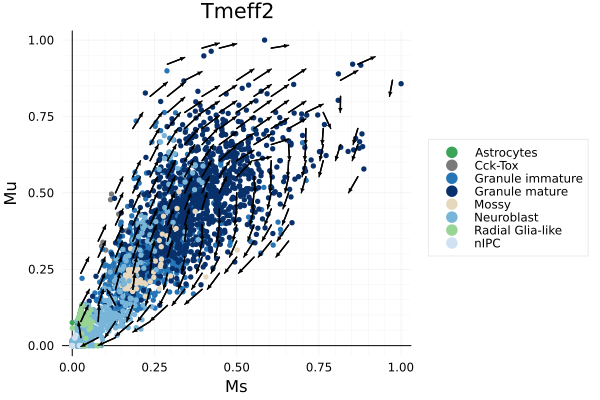

In [23]:
p1 = plot(legend = :outerright)
for label in labels
    scatter!(X[2, celltype .== label, idx], X[1, celltype .== label, idx], label = label, color = palattes[label], xlabel = "Ms", ylabel = "Mu", title = genes[idx])
end
quiver!(point_vector[:, 1], point_vector[:, 2], quiver = (arrow_vector[:, 1], arrow_vector[:, 2]), arrow = arrow(:closed), color = "#000000")

In [24]:
idx2 = findfirst(x -> x == "Jph1", genes)

14

In [25]:
arrow_vector1, point_vector1 = gene_plot(X[:, :, idx2], velocity[:, :, idx2])

([0.0039898734788184976 0.05263157894736842; 0.024517655415050854 0.05263157894736842; … ; -0.013212999675008111 -0.05263157894736837; -0.05263157894736848 -0.031585747385874656], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.8157894736842105 0.6578947368421053; 0.9736842105263157 0.39473684210526316])

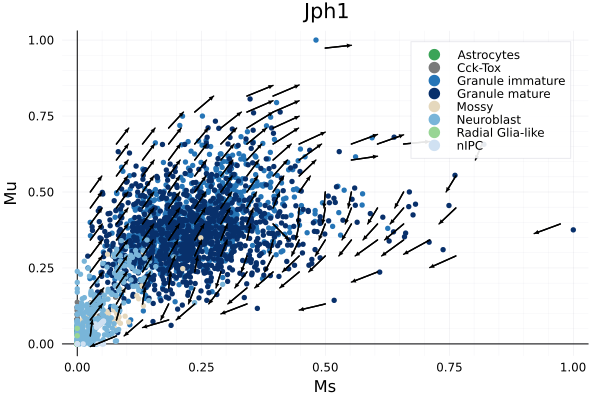

In [26]:
p2 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx2], X[1, celltype .== label, idx2], label = label, color = palattes[label], xlabel = "Ms", ylabel = "Mu", title = genes[idx2])
end
quiver!(point_vector1[:, 1], point_vector1[:, 2], quiver = (arrow_vector1[:, 1], arrow_vector1[:, 2]), arrow = arrow(:closed), color = "#000000")

In [27]:
idx3 = findfirst(x -> x == "Col19a1", genes)

16

In [28]:
arrow_vector2, point_vector2 = gene_plot(X[:, :, idx3], velocity[:, :, idx3])

([-0.0054059289174190565 0.05263157894736842; 0.029422399788067294 0.05263157894736842; … ; -0.052631578947368474 -0.03744490672923461; -0.012256864381402274 -0.052631578947368474], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.39473684210526316; 0.9736842105263157 0.763157894736842])

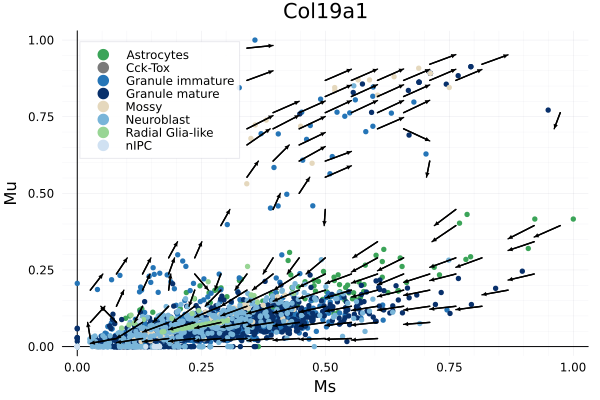

In [29]:
p3 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx3], X[1, celltype .== label, idx3], label = label, color = palattes[label], xlabel = "Ms", ylabel = "Mu", title = genes[idx3])
end
quiver!(point_vector2[:, 1], point_vector2[:, 2], quiver = (arrow_vector2[:, 1], arrow_vector2[:, 2]), arrow = arrow(:closed), color = "#000000")

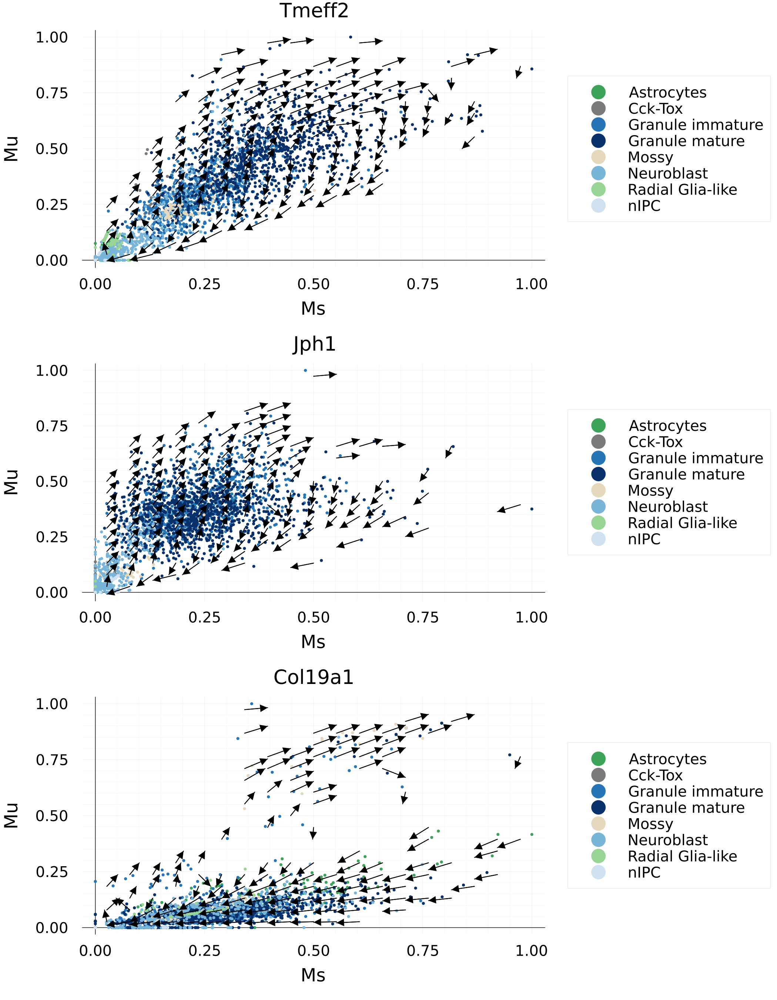

In [30]:
p = plot(p1, p2, p3, layout = (3, 1), size = (1400, 1800), dpi = 150, left_margins = 1.0Plots.cm, bottom_margins = 0.5Plots.cm, legendfontsize = 18, 
    legend = :outerright, xtickfontsize = 18, ytickfontsize = 18, xguidefontsize = 22, yguidefontsize = 22, titlefontsize = 24)

In [31]:
savefig(p, "figure/JuloVelo_velocity_vector.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/dentategyrus/main_branch/figure/JuloVelo_velocity_vector.png"

## Kinetics embedding

In [32]:
kinetics_embedding(adata; basis = "umap");

In [33]:
embedding = adata.obsm["kinetics_umap"];

In [34]:
celltype = adata.obs[!, "clusters"]
labels = sort(unique(celltype))

8-element Vector{String}:
 "Astrocytes"
 "Cck-Tox"
 "Granule immature"
 "Granule mature"
 "Mossy"
 "Neuroblast"
 "Radial Glia-like"
 "nIPC"

In [35]:
theme(:vibrant, framestyle = :axes, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

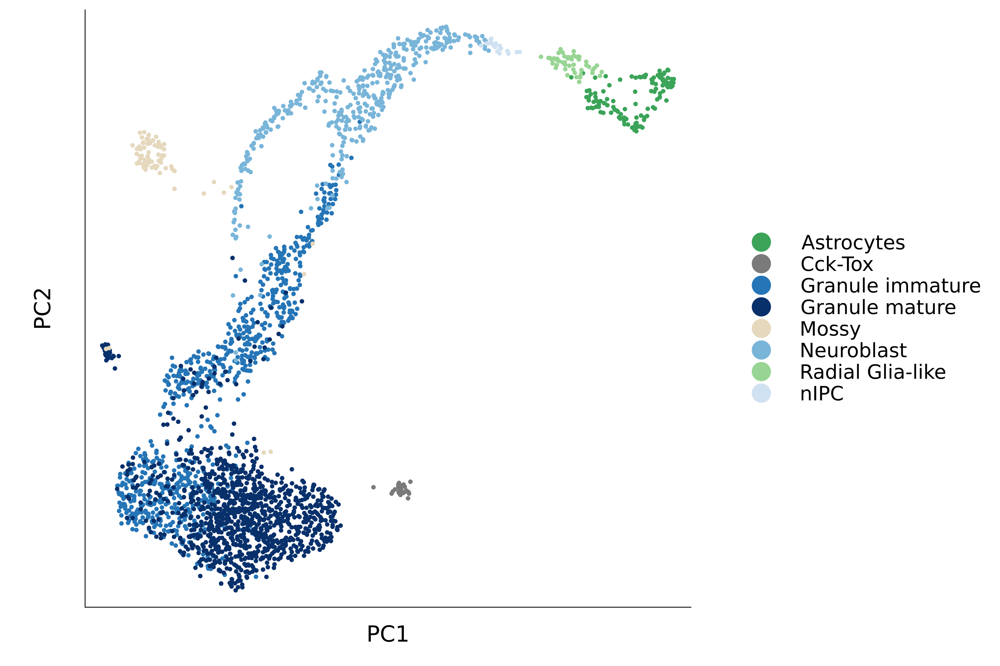

In [36]:
p = scatter(size = (1200, 800), fg_legend = :transparent, left_margin = 1.8Plots.cm, bottom_margin = 1.0Plots.cm, dpi = 300) #
for label in labels
    scatter!(embedding[celltype .== label, 1], embedding[celltype .== label, 2], label = label, color = palattes[label], legend=:outerright, legendfontsize = 16
        , xlabel = "PC1", ylabel = "PC2", xtick = nothing, yticks = nothing, xguidefontsize = 18, yguidefontsize = 18)
end
p

In [37]:
savefig(p, "figure/dentategyrus_kinetic_embedding.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/dentategyrus/main_branch/figure/dentategyrus_kinetic_embedding.png"